# The Three Body Problem
- Daniel Kutsch 



In [30]:
import numpy as np
from matplotlib import pyplot as plt 
import matplotlib

matplotlib.rcParams['animation.embed_limit'] = 2**128
from scipy import integrate
import matplotlib.animation as animation
from IPython.display import HTML

The [three-body problem](https://en.wikipedia.org/wiki/Three-body_problem), the motion of three particles under their mutual gravitational force, is a centuries old problem in physics going back to Isaac Newton.  There are many different regimes of the three-body problem that depend on the masses and seperations of the particles.  Some of these are stable (like the Earth-Moon-Sun system), but most configurations are not stable in general.  If I start with three particles at rest, almost any generic configuration will be unstable.

In [33]:
def right_hand_side(t,vec):
    
    '''
    Returns the right-hand side of the 1st-order form of Newton's 2nd Law (above equation)
        
    PARAMETERS:
        t   - time (not needed for our problem)
        vec - input state vector (\vec{f} from above)
    
    RETURN VALUE:
        vecout - 18 Element NumPy array (\vec{F} from above)
    '''
    
    G=1 

    x1,y1,z1,vx1,vy1,vz1,x2,y2,z2,vx2,vy2,vz2,x3,y3,z3,vx3,vy3,vz3 = vec

    r12 = np.sqrt(np.power(x2-x1, 2)+np.power(y2-y1,2)+np.power(z2-z1,2))
    r13 = np.sqrt(np.power(x3-x1, 2)+np.power(y3-y1,2)+np.power(z3-z1,2))
    r23 = np.sqrt(np.power(x3-x2, 2)+np.power(y3-y2,2)+np.power(z3-z2,2))

    F12x = (G*((x2-x1)/r12))/np.power(r12, 2)
    F12y = (G*((y2-y1)/r12))/np.power(r12, 2)
    F12z = (G*((z2-z1)/r12))/np.power(r12, 2)
    F13x = (G*((x3-x1)/r13))/np.power(r13, 2)
    F13y = (G*((y3-y1)/r13))/np.power(r13, 2)
    F13z = (G*((z3-z1)/r13))/np.power(r13, 2)
    F23x = (G*((x3-x2)/r23))/np.power(r23, 2)
    F23y = (G*((y3-y2)/r23))/np.power(r23, 2)
    F23z = (G*((z3-z2)/r23))/np.power(r23, 2)
    
    ## Put your solution from HW08 here
    fx1 = vx1 ## and so on
    fy1 = vy1
    fz1 = vz1
    fvx1 = (F12x+F13x)
    fvy1 = (F12y+F13y)
    fvz1 = (F12z+F13z)
    fx2 = vx2
    fy2 = vy2
    fz2 = vz2
    fvx2 = (-F12x+F23x)
    fvy2 = (-F12y+F23y)
    fvz2 = (-F12z+F23z)
    fx3 = vx3
    fy3 = vy3
    fz3 = vz3
    fvx3 = (-F13x-F23x)
    fvy3 = (-F13y-F23y)
    fvz3 = (-F13z-F23z)  
    
    vecout = fx1,fy1,fz1,fvx1,fvy1,fvz1,fx2,fy2,fz2,fvx2,fvy2,fvz2,fx3,fy3,fz3,fvx3,fvy3,fvz3 

    return vecout


There are a **handful of stable configurations** of the three-body problem.  I've included the initial conditions for one of them (the figure-8) below.

In [36]:
## These are the initial conditions for one of the few *stable* three-body problems
initial_conditions_stable = np.array([0.97000436,-0.24308753,0,0.93240737/2,0.86473146/2,0,
                               -0.97000436,0.24308753,0,0.93240737/2,0.86473146/2,0,
                               0,0,0,-0.93240737,-0.86473146,0])

times = np.linspace(0,25,250)

## Integrate your initial value problem here
output = integrate.solve_ivp(right_hand_side,
                             (0,250),
                             initial_conditions_stable,
                             t_eval=times,
                             method='DOP853',
                            rtol=1e-8)

print(output.message)

## Data (an 18x250 NumPy array) is saved in output.y
x1,y1,z1,vx1,vy1,vz1,x2,y2,z2,vx2,vy2,vz2,x3,y3,z3,vx3,vy3,vz3 = output.y

The solver successfully reached the end of the integration interval.


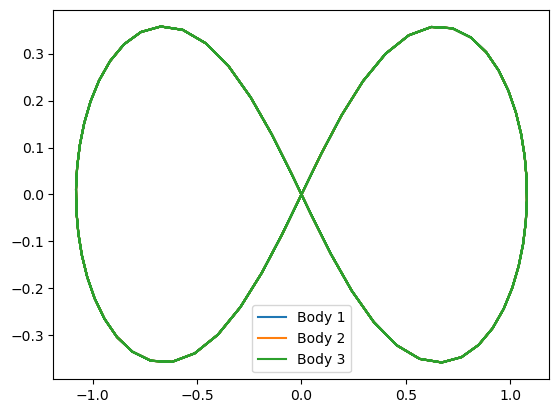

In [38]:
## Plot
plt.plot(x1, y1, label="Body 1")
plt.plot(x2, y2, label="Body 2")
plt.plot(x3, y3, label="Body 3")
plt.legend()
plt.show()


In [40]:
def animate_three_body_problem(output_vector,fps=30,boxsize=1.2,N_skip=1):
    
    '''
    Creates an Animation of the motion of three particles
        
    PARAMETERS:
        output_vector -- the 18-element vector of your integrated 3-body problem
        fps           -- Frames per second of the animation (default = 30)
        boxsize       -- How big to make the animation (default = 1.2)
        N_skip        -- How many frames to skip (default = 1)
    
    RETURN VALUE:
        anim -- Matplotlib animation 
    '''
    
    x1,y1,z1,vx1,vy1,vz1,x2,y2,z2,vx2,vy2,vz2,x3,y3,z3,vx3,vy3,vz3 = output_vector
    

    fig,ax = plt.subplots()

    ## Convert from FPS to interval (milliseconds between frames)
    interval = 1000//fps
    N_total = len(x1)
    N_frames = N_total//N_skip
    
    xs = [x1,x2,x3]
    ys = [y1,y2,y3]

    scatter_plots = []
    line_plots = []
    
    ## Create the initial scatter plot and line plot
    for i in range(3):
        scatter_plots.append(ax.scatter(xs[i][0], ys[i][0],edgecolors='black'))
        line_plots.append(ax.plot(xs[i][0],ys[i][0],alpha=0.8,zorder=-1)[0])

    ## Definte the function we'll call to generate the plots
    def update(frame):
        for i in range(3):
            ## Update the scatter plots
            scatter_plots[i].set_offsets([xs[i][frame*N_skip],ys[i][frame*N_skip]])

            ## And the line plots
            line_plots[i].set_xdata(xs[i][:frame*N_skip])
            line_plots[i].set_ydata(ys[i][:frame*N_skip])

        ## Also reset the size of the axes
        ax.set_xlim(-boxsize,boxsize)
        ax.set_ylim(-boxsize,boxsize)

    ## The animation 
    ani = animation.FuncAnimation(fig=fig, 
                                  func=update, 
                                  frames=N_frames, 
                                  interval=interval)
    
    plt.close()
    
    return ani

In [42]:
anim = animate_three_body_problem(output.y)
HTML(anim.to_jshtml())

## Unstable configurations and chaos theory

Formally speaking, most configurations of the three-body problem you can cook up are unstable, and **chaotic**, meaning that **slight changes in initial conditions** produce completely different outputs.

In [45]:
initial_conditions_unstable = np.array([-2,-2,0,0,0,0,2,-1,0,0,0,0,0,1,0,0,0,0])

In [50]:
times = np.linspace(0,1000,3000)

## Integrate your initial value problem here
output = integrate.solve_ivp(right_hand_side,
                             (0,3000),
                             initial_conditions_unstable,
                             t_eval=times,
                             method='DOP853',
                            rtol=1e-8)

print(output.message)

## Data (an 18x250 NumPy array) is saved in output.y
x1,y1,z1,vx1,vy1,vz1,x2,y2,z2,vx2,vy2,vz2,x3,y3,z3,vx3,vy3,vz3 = output.y


The solver successfully reached the end of the integration interval.


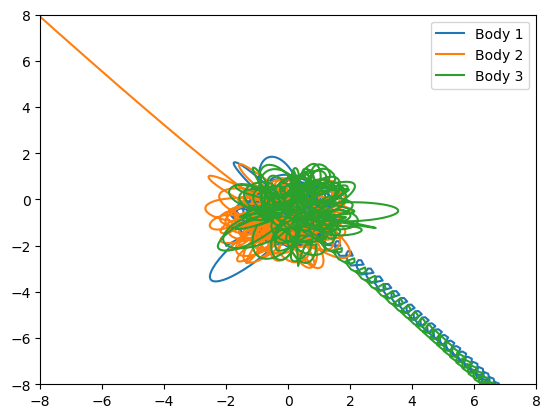

In [66]:
## Plot of the positions of the three particles
plt.plot(x1, y1, label="Body 1")
plt.plot(x2, y2, label="Body 2")
plt.plot(x3, y3, label="Body 3")
plt.legend()
plt.xlim(-8,8)
plt.ylim(-8,8)
plt.show()

In [59]:
initial_conditions_unstable = np.array([-2,-2,-1,0,0,0,2,-1,0,0,0,0,0,1,0,0,0,0])

times = np.linspace(0,1000,3000)

output = integrate.solve_ivp(right_hand_side,
                             (0,3000),
                             initial_conditions_unstable,
                             t_eval=times,
                             method='DOP853',
                            rtol=1e-8)

print(output.message)

## The data (an 18x250 NumPy array) is saved in output.y
x1,y1,z1,vx1,vy1,vz1,x2,y2,z2,vx2,vy2,vz2,x3,y3,z3,vx3,vy3,vz3 = output.y

The solver successfully reached the end of the integration interval.


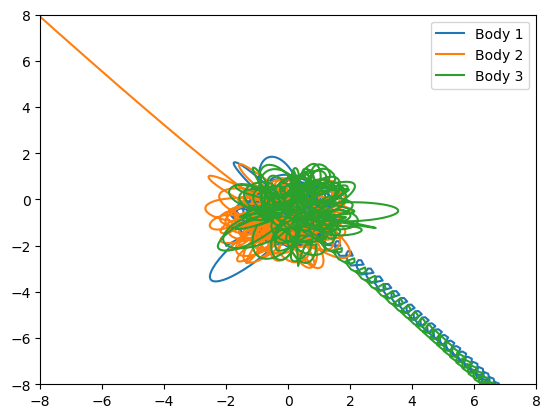

In [68]:
#Plot
plt.plot(x1, y1, label="Body 1")
plt.plot(x2, y2, label="Body 2")
plt.plot(x3, y3, label="Body 3")
plt.legend()
plt.xlim(-8,8)
plt.ylim(-8,8)
plt.show()


Increase `N_skip`, which will only include every to show only every N integration in the animation.  Otherwise it will take a while...

In [74]:
anim = animate_three_body_problem(output.y, boxsize=8, N_skip=25)
HTML(anim.to_jshtml())